In [1]:
import os
import re
import zipfile

import numpy as np

import matplotlib.pyplot as plt
import pandas as pd

from PIL import Image
import ast
import json
from glob import glob

In [63]:
max_data_m = 100

In [4]:
folder_WCS = '/media/mvlab/46FA9CA2FA9C8FB3/dataset/WCS Camera Traps/'

In [5]:
os.path.isdir(folder_WCS)

True

In [58]:
path_label = folder_WCS + 'wcs_20200403_bboxes.json'
path_image = folder_WCS

os.path.isfile(path_label), os.path.isfile(path_label)

(True, True)

In [11]:
categories= [
  {
   "id": 0,
   "name": "empty"
  },
  {
   "id": 1,
   "name": "animal"
  },
  {
   "id": 2,
   "name": "person"
  },
  {
   "id": 3,
   "name": "group"
  },
  {
   "id": 4,
   "name": "vehicle"
  }
 ]

In [27]:
class_names = []
for category in categories:
    d = dict(category)
    #print(d['name'], d['id'])
    class_names.append(d['name'])
    
print(len(class_names), class_names)

5 ['empty', 'animal', 'person', 'group', 'vehicle']


In [28]:
with open(path_label, 'r') as j:
     contents = json.loads(j.read())

In [29]:
images = contents['images']
annotations = contents['annotations']
print(len(images), images[0])
print(len(annotations), annotations[0])

42584 {'id': 'd6d634e4-92d4-11e9-b2d7-000d3a74c7de', 'file_name': 'animals/0043/0766.jpg', 'seq_id': 'bol-018-d0018-1', 'seq_num_frames': 6, 'frame_num': 7, 'location': '695', 'country_code': 'bol', 'datetime': '2012-09-01 12:06:11.000', 'match_level': 0, 'image_id': 'd6d634e4-92d4-11e9-b2d7-000d3a74c7de', 'corrupt': False, 'wcs_id': 'bol-018-d0018-i003456', 'sex': 'unknown', 'count': 1, 'age': 'unknown', 'width': 2048, 'height': 1536}
40407 {'id': '95ed9b82-7638-11ea-83b7-eb0d39d35107', 'image_id': '58cffcce-92d5-11e9-b83f-000d3a74c7de', 'bbox': [1863, 890, 491, 389], 'category_id': 1}


In [45]:
file_name_id_dict = dict()
for image in images:
    file_name = image['file_name']
    id_num = image['id']    
    file_name_id_dict[file_name] = id_num
len(file_name_id_dict)

42584

In [51]:
file_name_id_dict = dict()
for image in images:
    file_name = image['file_name']
    id_num = image['id']    
    file_name_id_dict[id_num] = file_name
len(file_name_id_dict)

42584

In [46]:
id_values = file_name_id_dict.values()
len(id_values), len(set(id_values)), min(id_values), max(id_values)

(42584,
 42584,
 '0000f310-92d5-11e9-ad49-000d3a74c7de',
 'fffd228e-92d4-11e9-b3f2-000d3a74c7de')

In [84]:
id_bbox_dict = dict()
multi_object_k = 0
for annotation in annotations:    
    image_id = annotation['image_id']
    bbox = annotation['bbox']
    category_id = annotation['category_id']
    
    image_id = image_id
           
    bbox = np.array(bbox, dtype=np.int)
    x, y, w, h = bbox
    bbox = [int(category_id), x, y, x+w, y+h]
    #print('image_id',image_id, 'category',category_id,'bbox', bbox)
    
    if image_id in id_bbox_dict.keys():
        id_bbox_dict[image_id].extend(bbox)        
        multi_object_k += 1
    else:
        id_bbox_dict[image_id] = bbox
        
len(id_bbox_dict.keys()), multi_object_k

(26860, 13547)

In [85]:
path_image

'/media/mvlab/46FA9CA2FA9C8FB3/dataset/WCS Camera Traps/'

In [104]:
annotation = dict()
m_key = len(id_bbox_dict.keys())
for file_id in id_bbox_dict.keys():
    
    file_name = file_name_id_dict[file_id]    
    bboxes = id_bbox_dict[file_id]
    #print('file_id', file_id, 'file_name', file_name, 'bboxes', bboxes)
    file_full_path = path_image + file_name
    bboxes_2d = np.reshape(bboxes, [-1, 5])
    
    if os.path.isfile(file_full_path):        
        annotation[file_full_path] = bboxes_2d
        if len(annotation) % 1000 ==0:
            print(m_key, len(annotation), 'file_id', file_id, 'file_name', file_name, 'bboxes', bboxes)
        
    else:
        continue
    
len(annotation), type(annotation)

26860 1000 file_id 5d3be768-92d5-11e9-9aef-000d3a74c7de file_name animals/0411/1671.jpg bboxes [1, 599, 418, 786, 592]
26860 2000 file_id 5de60a1c-92d5-11e9-a695-000d3a74c7de file_name animals/0413/1387.jpg bboxes [1, 17, 792, 322, 980]
26860 3000 file_id ee2623e8-92d4-11e9-a644-000d3a74c7de file_name animals/0107/1310.jpg bboxes [1, 1, 33, 1111, 1046]
26860 4000 file_id ec15ba9c-92d4-11e9-8b48-000d3a74c7de file_name animals/0101/1856.jpg bboxes [1, 3, 581, 1397, 1502, 1, 1344, 31, 2044, 1503]
26860 5000 file_id 5112ab67-92d5-11e9-8b7e-000d3a74c7de file_name animals/0378/0878.jpg bboxes [1, 447, 17, 1142, 932]
26860 6000 file_id 38037376-92d5-11e9-b798-000d3a74c7de file_name animals/0309/0231.jpg bboxes [1, 1, 550, 780, 1008]
26860 7000 file_id 05c05b03-92d5-11e9-8869-000d3a74c7de file_name animals/0172/1705.jpg bboxes [1, 0, 610, 638, 1334]
26860 8000 file_id 190fcc70-92d5-11e9-a8d8-000d3a74c7de file_name animals/0225/1372.jpg bboxes [1, 422, 487, 668, 1008, 1, 229, 442, 410, 613]
268

(21463, dict)

In [117]:
bbox_list = []

i = -1
for file_name in annotation.keys():
    i += 1
    #if i%10>=2:continue#46.7GB 74%
    #if i%6>=2:continue#27.2G > 45G 72%
    if i%4>=2:continue#27.2G > 45G 72%
    
    file_full_path_train = file_name
     
    bboxes = annotation[file_name]
    bboxes_2d = np.reshape(bboxes, [-1, 5])
    cls = bboxes_2d[:, :1]
    boxes_2d = bboxes_2d[:, 1:]
    
    x0 = boxes_2d[:, 1]
    y0 = boxes_2d[:, 2]
    x1 = boxes_2d[:, 3]
    #y1 = boxes_2d[:, 4]
    bbox_list.append(bboxes_2d)
print('input_list', len(input_list), len(bbox_list))

input_list 0 10732


cls {1, 2, 3, 4}


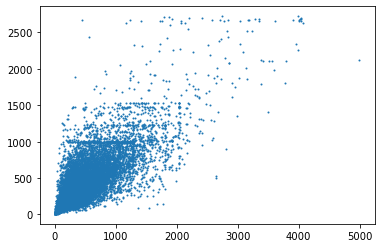

In [118]:
bbox_arr = np.concatenate(bbox_list, 0)
cls = bbox_arr[:, 0]
x0 = bbox_arr[:, 1]
y0 = bbox_arr[:, 2]
x1 = bbox_arr[:, 3]
y1 = bbox_arr[:, 4]
print('cls', set(cls))
box_w = x1 - x0
box_h = y1 - y0
h = plt.scatter(box_w, box_h, s=1)

In [106]:
input_list = []
bbox_list = []

i = -1
for file_name in annotation.keys():
    i += 1
    #if i%10>=2:continue#46.7GB 74%
    #if i%6>=2:continue#27.2G > 45G 72%
    if i%4>=2:continue#27.2G > 45G 72%
    
    file_full_path_train = file_name
     
    bboxes = annotation[file_name]
    bboxes_2d = np.reshape(bboxes, [-1, 5])
    cls = bboxes_2d[:, :1]
    boxes_2d = bboxes_2d[:, 1:]
    
        
    if os.path.isfile(file_full_path_train):
        img = Image.open(file_full_path_train)
        img_arr = np.array(img)
                
        h, w, c = img_arr.shape
        scale = np.array((w, h, w, h))
        scale = np.reshape(scale, (1, 4))
        box_norm = boxes_2d.astype(np.float) / scale.astype(np.float)        
        #print(cls, box_norm)
        cls_bbox_norm = np.concatenate((cls, box_norm), axis=1)
        
        #input_list.append(img_arr)
        bbox_list.append(cls_bbox_norm)    
        #print(cls_bbox_norm.shape)
        if len(input_list) % 1000==0:
            print('reading image', len(file_name_id_dict.keys()), i, len(input_list))        
        if len(input_list)>=max_data_m:
            break
print('input_list', len(input_list), len(bbox_list))

reading image 42584 0 0
reading image 42584 1 0
reading image 42584 4 0
reading image 42584 5 0
reading image 42584 8 0
reading image 42584 9 0
reading image 42584 12 0
reading image 42584 13 0
reading image 42584 16 0
reading image 42584 17 0
reading image 42584 20 0
reading image 42584 21 0
reading image 42584 24 0
reading image 42584 25 0
reading image 42584 28 0
reading image 42584 29 0
reading image 42584 32 0
reading image 42584 33 0
reading image 42584 36 0
reading image 42584 37 0
reading image 42584 40 0
reading image 42584 41 0
reading image 42584 44 0
reading image 42584 45 0
reading image 42584 48 0
reading image 42584 49 0
reading image 42584 52 0
reading image 42584 53 0
reading image 42584 56 0
reading image 42584 57 0
reading image 42584 60 0
reading image 42584 61 0
reading image 42584 64 0
reading image 42584 65 0
reading image 42584 68 0
reading image 42584 69 0
reading image 42584 72 0
reading image 42584 73 0
reading image 42584 76 0
reading image 42584 77 0
readin

reading image 42584 636 0
reading image 42584 637 0
reading image 42584 640 0
reading image 42584 641 0
reading image 42584 644 0
reading image 42584 645 0
reading image 42584 648 0
reading image 42584 649 0
reading image 42584 652 0
reading image 42584 653 0
reading image 42584 656 0
reading image 42584 657 0
reading image 42584 660 0
reading image 42584 661 0
reading image 42584 664 0
reading image 42584 665 0
reading image 42584 668 0
reading image 42584 669 0
reading image 42584 672 0
reading image 42584 673 0
reading image 42584 676 0
reading image 42584 677 0
reading image 42584 680 0
reading image 42584 681 0
reading image 42584 684 0
reading image 42584 685 0
reading image 42584 688 0
reading image 42584 689 0
reading image 42584 692 0
reading image 42584 693 0
reading image 42584 696 0
reading image 42584 697 0
reading image 42584 700 0
reading image 42584 701 0
reading image 42584 704 0
reading image 42584 705 0
reading image 42584 708 0
reading image 42584 709 0
reading imag

reading image 42584 1264 0
reading image 42584 1265 0
reading image 42584 1268 0
reading image 42584 1269 0
reading image 42584 1272 0
reading image 42584 1273 0
reading image 42584 1276 0
reading image 42584 1277 0
reading image 42584 1280 0
reading image 42584 1281 0
reading image 42584 1284 0
reading image 42584 1285 0
reading image 42584 1288 0
reading image 42584 1289 0
reading image 42584 1292 0
reading image 42584 1293 0
reading image 42584 1296 0
reading image 42584 1297 0
reading image 42584 1300 0
reading image 42584 1301 0
reading image 42584 1304 0
reading image 42584 1305 0
reading image 42584 1308 0
reading image 42584 1309 0
reading image 42584 1312 0
reading image 42584 1313 0
reading image 42584 1316 0
reading image 42584 1317 0
reading image 42584 1320 0
reading image 42584 1321 0
reading image 42584 1324 0
reading image 42584 1325 0
reading image 42584 1328 0
reading image 42584 1329 0
reading image 42584 1332 0
reading image 42584 1333 0
reading image 42584 1336 0
r

reading image 42584 1873 0
reading image 42584 1876 0
reading image 42584 1877 0
reading image 42584 1880 0
reading image 42584 1881 0
reading image 42584 1884 0
reading image 42584 1885 0
reading image 42584 1888 0
reading image 42584 1889 0
reading image 42584 1892 0
reading image 42584 1893 0
reading image 42584 1896 0
reading image 42584 1897 0
reading image 42584 1900 0
reading image 42584 1901 0
reading image 42584 1904 0
reading image 42584 1905 0
reading image 42584 1908 0
reading image 42584 1909 0
reading image 42584 1912 0
reading image 42584 1913 0
reading image 42584 1916 0
reading image 42584 1917 0
reading image 42584 1920 0
reading image 42584 1921 0
reading image 42584 1924 0
reading image 42584 1925 0
reading image 42584 1928 0
reading image 42584 1929 0
reading image 42584 1932 0
reading image 42584 1933 0
reading image 42584 1936 0
reading image 42584 1937 0
reading image 42584 1940 0
reading image 42584 1941 0
reading image 42584 1944 0
reading image 42584 1945 0
r

reading image 42584 2481 0
reading image 42584 2484 0
reading image 42584 2485 0
reading image 42584 2488 0
reading image 42584 2489 0
reading image 42584 2492 0
reading image 42584 2493 0
reading image 42584 2496 0
reading image 42584 2497 0
reading image 42584 2500 0
reading image 42584 2501 0
reading image 42584 2504 0
reading image 42584 2505 0
reading image 42584 2508 0
reading image 42584 2509 0
reading image 42584 2512 0
reading image 42584 2513 0
reading image 42584 2516 0
reading image 42584 2517 0
reading image 42584 2520 0
reading image 42584 2521 0
reading image 42584 2524 0
reading image 42584 2525 0
reading image 42584 2528 0
reading image 42584 2529 0
reading image 42584 2532 0
reading image 42584 2533 0
reading image 42584 2536 0
reading image 42584 2537 0
reading image 42584 2540 0
reading image 42584 2541 0
reading image 42584 2544 0
reading image 42584 2545 0
reading image 42584 2548 0
reading image 42584 2549 0
reading image 42584 2552 0
reading image 42584 2553 0
r

reading image 42584 3092 0
reading image 42584 3093 0
reading image 42584 3096 0
reading image 42584 3097 0
reading image 42584 3100 0
reading image 42584 3101 0
reading image 42584 3104 0
reading image 42584 3105 0
reading image 42584 3108 0
reading image 42584 3109 0
reading image 42584 3112 0
reading image 42584 3113 0
reading image 42584 3116 0
reading image 42584 3117 0
reading image 42584 3120 0
reading image 42584 3121 0
reading image 42584 3124 0
reading image 42584 3125 0
reading image 42584 3128 0
reading image 42584 3129 0
reading image 42584 3132 0
reading image 42584 3133 0
reading image 42584 3136 0
reading image 42584 3137 0
reading image 42584 3140 0
reading image 42584 3141 0
reading image 42584 3144 0
reading image 42584 3145 0
reading image 42584 3148 0
reading image 42584 3149 0
reading image 42584 3152 0
reading image 42584 3153 0
reading image 42584 3156 0
reading image 42584 3157 0
reading image 42584 3160 0
reading image 42584 3161 0
reading image 42584 3164 0
r

reading image 42584 3705 0
reading image 42584 3708 0
reading image 42584 3709 0
reading image 42584 3712 0
reading image 42584 3713 0
reading image 42584 3716 0
reading image 42584 3717 0
reading image 42584 3720 0
reading image 42584 3721 0
reading image 42584 3724 0
reading image 42584 3725 0
reading image 42584 3728 0
reading image 42584 3729 0
reading image 42584 3732 0
reading image 42584 3733 0
reading image 42584 3736 0
reading image 42584 3737 0
reading image 42584 3740 0
reading image 42584 3741 0
reading image 42584 3744 0
reading image 42584 3745 0
reading image 42584 3748 0
reading image 42584 3749 0
reading image 42584 3752 0
reading image 42584 3753 0
reading image 42584 3756 0
reading image 42584 3757 0
reading image 42584 3760 0
reading image 42584 3761 0
reading image 42584 3764 0
reading image 42584 3765 0
reading image 42584 3768 0
reading image 42584 3769 0
reading image 42584 3772 0
reading image 42584 3773 0
reading image 42584 3776 0
reading image 42584 3777 0
r

reading image 42584 4316 0
reading image 42584 4317 0
reading image 42584 4320 0
reading image 42584 4321 0
reading image 42584 4324 0
reading image 42584 4325 0
reading image 42584 4328 0
reading image 42584 4329 0
reading image 42584 4332 0
reading image 42584 4333 0
reading image 42584 4336 0
reading image 42584 4337 0
reading image 42584 4340 0
reading image 42584 4341 0
reading image 42584 4344 0
reading image 42584 4345 0
reading image 42584 4348 0
reading image 42584 4349 0
reading image 42584 4352 0
reading image 42584 4353 0
reading image 42584 4356 0
reading image 42584 4357 0
reading image 42584 4360 0
reading image 42584 4361 0
reading image 42584 4364 0
reading image 42584 4365 0
reading image 42584 4368 0
reading image 42584 4369 0
reading image 42584 4372 0
reading image 42584 4373 0
reading image 42584 4376 0
reading image 42584 4377 0
reading image 42584 4380 0
reading image 42584 4381 0
reading image 42584 4384 0
reading image 42584 4385 0
reading image 42584 4388 0
r

reading image 42584 4924 0
reading image 42584 4925 0
reading image 42584 4928 0
reading image 42584 4929 0
reading image 42584 4932 0
reading image 42584 4933 0
reading image 42584 4936 0
reading image 42584 4937 0
reading image 42584 4940 0
reading image 42584 4941 0
reading image 42584 4944 0
reading image 42584 4945 0
reading image 42584 4948 0
reading image 42584 4949 0
reading image 42584 4952 0
reading image 42584 4953 0
reading image 42584 4956 0
reading image 42584 4957 0
reading image 42584 4960 0
reading image 42584 4961 0
reading image 42584 4964 0
reading image 42584 4965 0
reading image 42584 4968 0
reading image 42584 4969 0
reading image 42584 4972 0
reading image 42584 4973 0
reading image 42584 4976 0
reading image 42584 4977 0
reading image 42584 4980 0
reading image 42584 4981 0
reading image 42584 4984 0
reading image 42584 4985 0
reading image 42584 4988 0
reading image 42584 4989 0
reading image 42584 4992 0
reading image 42584 4993 0
reading image 42584 4996 0
r

reading image 42584 5541 0
reading image 42584 5544 0
reading image 42584 5545 0
reading image 42584 5548 0
reading image 42584 5549 0
reading image 42584 5552 0
reading image 42584 5553 0
reading image 42584 5556 0
reading image 42584 5557 0
reading image 42584 5560 0
reading image 42584 5561 0
reading image 42584 5564 0
reading image 42584 5565 0
reading image 42584 5568 0
reading image 42584 5569 0
reading image 42584 5572 0
reading image 42584 5573 0
reading image 42584 5576 0
reading image 42584 5577 0
reading image 42584 5580 0
reading image 42584 5581 0
reading image 42584 5584 0
reading image 42584 5585 0
reading image 42584 5588 0
reading image 42584 5589 0
reading image 42584 5592 0
reading image 42584 5593 0
reading image 42584 5596 0
reading image 42584 5597 0
reading image 42584 5600 0
reading image 42584 5601 0
reading image 42584 5604 0
reading image 42584 5605 0
reading image 42584 5608 0
reading image 42584 5609 0
reading image 42584 5612 0
reading image 42584 5613 0
r

reading image 42584 6156 0
reading image 42584 6157 0
reading image 42584 6160 0
reading image 42584 6161 0
reading image 42584 6164 0
reading image 42584 6165 0
reading image 42584 6168 0
reading image 42584 6169 0
reading image 42584 6172 0
reading image 42584 6173 0
reading image 42584 6176 0
reading image 42584 6177 0
reading image 42584 6180 0
reading image 42584 6181 0
reading image 42584 6184 0
reading image 42584 6185 0
reading image 42584 6188 0
reading image 42584 6189 0
reading image 42584 6192 0
reading image 42584 6193 0
reading image 42584 6196 0
reading image 42584 6197 0
reading image 42584 6200 0
reading image 42584 6201 0
reading image 42584 6204 0
reading image 42584 6205 0
reading image 42584 6208 0
reading image 42584 6209 0
reading image 42584 6212 0
reading image 42584 6213 0
reading image 42584 6216 0
reading image 42584 6217 0
reading image 42584 6220 0
reading image 42584 6221 0
reading image 42584 6224 0
reading image 42584 6225 0
reading image 42584 6228 0
r

reading image 42584 6769 0
reading image 42584 6772 0
reading image 42584 6773 0
reading image 42584 6776 0
reading image 42584 6777 0
reading image 42584 6780 0
reading image 42584 6781 0
reading image 42584 6784 0
reading image 42584 6785 0
reading image 42584 6788 0
reading image 42584 6789 0
reading image 42584 6792 0
reading image 42584 6793 0
reading image 42584 6796 0
reading image 42584 6797 0
reading image 42584 6800 0
reading image 42584 6801 0
reading image 42584 6804 0
reading image 42584 6805 0
reading image 42584 6808 0
reading image 42584 6809 0
reading image 42584 6812 0
reading image 42584 6813 0
reading image 42584 6816 0
reading image 42584 6817 0
reading image 42584 6820 0
reading image 42584 6821 0
reading image 42584 6824 0
reading image 42584 6825 0
reading image 42584 6828 0
reading image 42584 6829 0
reading image 42584 6832 0
reading image 42584 6833 0
reading image 42584 6836 0
reading image 42584 6837 0
reading image 42584 6840 0
reading image 42584 6841 0
r

reading image 42584 7377 0
reading image 42584 7380 0
reading image 42584 7381 0
reading image 42584 7384 0
reading image 42584 7385 0
reading image 42584 7388 0
reading image 42584 7389 0
reading image 42584 7392 0
reading image 42584 7393 0
reading image 42584 7396 0
reading image 42584 7397 0
reading image 42584 7400 0
reading image 42584 7401 0
reading image 42584 7404 0
reading image 42584 7405 0
reading image 42584 7408 0
reading image 42584 7409 0
reading image 42584 7412 0
reading image 42584 7413 0
reading image 42584 7416 0
reading image 42584 7417 0
reading image 42584 7420 0
reading image 42584 7421 0
reading image 42584 7424 0
reading image 42584 7425 0
reading image 42584 7428 0
reading image 42584 7429 0
reading image 42584 7432 0
reading image 42584 7433 0
reading image 42584 7436 0
reading image 42584 7437 0
reading image 42584 7440 0
reading image 42584 7441 0
reading image 42584 7444 0
reading image 42584 7445 0
reading image 42584 7448 0
reading image 42584 7449 0
r

reading image 42584 7989 0
reading image 42584 7992 0
reading image 42584 7993 0
reading image 42584 7996 0
reading image 42584 7997 0
reading image 42584 8000 0
reading image 42584 8001 0
reading image 42584 8004 0
reading image 42584 8005 0
reading image 42584 8008 0
reading image 42584 8009 0
reading image 42584 8012 0
reading image 42584 8013 0
reading image 42584 8016 0
reading image 42584 8017 0
reading image 42584 8020 0
reading image 42584 8021 0
reading image 42584 8024 0
reading image 42584 8025 0
reading image 42584 8028 0
reading image 42584 8029 0
reading image 42584 8032 0
reading image 42584 8033 0
reading image 42584 8036 0
reading image 42584 8037 0
reading image 42584 8040 0
reading image 42584 8041 0
reading image 42584 8044 0
reading image 42584 8045 0
reading image 42584 8048 0
reading image 42584 8049 0
reading image 42584 8052 0
reading image 42584 8053 0
reading image 42584 8056 0
reading image 42584 8057 0
reading image 42584 8060 0
reading image 42584 8061 0
r

reading image 42584 8604 0
reading image 42584 8605 0
reading image 42584 8608 0
reading image 42584 8609 0
reading image 42584 8612 0
reading image 42584 8613 0
reading image 42584 8616 0
reading image 42584 8617 0
reading image 42584 8620 0
reading image 42584 8621 0
reading image 42584 8624 0
reading image 42584 8625 0
reading image 42584 8628 0
reading image 42584 8629 0
reading image 42584 8632 0
reading image 42584 8633 0
reading image 42584 8636 0
reading image 42584 8637 0
reading image 42584 8640 0
reading image 42584 8641 0
reading image 42584 8644 0
reading image 42584 8645 0
reading image 42584 8648 0
reading image 42584 8649 0
reading image 42584 8652 0
reading image 42584 8653 0
reading image 42584 8656 0
reading image 42584 8657 0
reading image 42584 8660 0
reading image 42584 8661 0
reading image 42584 8664 0
reading image 42584 8665 0
reading image 42584 8668 0
reading image 42584 8669 0
reading image 42584 8672 0
reading image 42584 8673 0
reading image 42584 8676 0
r

reading image 42584 9216 0
reading image 42584 9217 0
reading image 42584 9220 0
reading image 42584 9221 0
reading image 42584 9224 0
reading image 42584 9225 0
reading image 42584 9228 0
reading image 42584 9229 0
reading image 42584 9232 0
reading image 42584 9233 0
reading image 42584 9236 0
reading image 42584 9237 0
reading image 42584 9240 0
reading image 42584 9241 0
reading image 42584 9244 0
reading image 42584 9245 0
reading image 42584 9248 0
reading image 42584 9249 0
reading image 42584 9252 0
reading image 42584 9253 0
reading image 42584 9256 0
reading image 42584 9257 0
reading image 42584 9260 0
reading image 42584 9261 0
reading image 42584 9264 0
reading image 42584 9265 0
reading image 42584 9268 0
reading image 42584 9269 0
reading image 42584 9272 0
reading image 42584 9273 0
reading image 42584 9276 0
reading image 42584 9277 0
reading image 42584 9280 0
reading image 42584 9281 0
reading image 42584 9284 0
reading image 42584 9285 0
reading image 42584 9288 0
r

reading image 42584 9829 0
reading image 42584 9832 0
reading image 42584 9833 0
reading image 42584 9836 0
reading image 42584 9837 0
reading image 42584 9840 0
reading image 42584 9841 0
reading image 42584 9844 0
reading image 42584 9845 0
reading image 42584 9848 0
reading image 42584 9849 0
reading image 42584 9852 0
reading image 42584 9853 0
reading image 42584 9856 0
reading image 42584 9857 0
reading image 42584 9860 0
reading image 42584 9861 0
reading image 42584 9864 0
reading image 42584 9865 0
reading image 42584 9868 0
reading image 42584 9869 0
reading image 42584 9872 0
reading image 42584 9873 0
reading image 42584 9876 0
reading image 42584 9877 0
reading image 42584 9880 0
reading image 42584 9881 0
reading image 42584 9884 0
reading image 42584 9885 0
reading image 42584 9888 0
reading image 42584 9889 0
reading image 42584 9892 0
reading image 42584 9893 0
reading image 42584 9896 0
reading image 42584 9897 0
reading image 42584 9900 0
reading image 42584 9901 0
r

reading image 42584 10432 0
reading image 42584 10433 0
reading image 42584 10436 0
reading image 42584 10437 0
reading image 42584 10440 0
reading image 42584 10441 0
reading image 42584 10444 0
reading image 42584 10445 0
reading image 42584 10448 0
reading image 42584 10449 0
reading image 42584 10452 0
reading image 42584 10453 0
reading image 42584 10456 0
reading image 42584 10457 0
reading image 42584 10460 0
reading image 42584 10461 0
reading image 42584 10464 0
reading image 42584 10465 0
reading image 42584 10468 0
reading image 42584 10469 0
reading image 42584 10472 0
reading image 42584 10473 0
reading image 42584 10476 0
reading image 42584 10477 0
reading image 42584 10480 0
reading image 42584 10481 0
reading image 42584 10484 0
reading image 42584 10485 0
reading image 42584 10488 0
reading image 42584 10489 0
reading image 42584 10492 0
reading image 42584 10493 0
reading image 42584 10496 0
reading image 42584 10497 0
reading image 42584 10500 0
reading image 42584 

ValueError: not enough values to unpack (expected 3, got 0)

In [107]:
len(bbox_list)

5353

In [92]:
def visualize_detections_simple(
    image, boxes, classes, figsize=(12, 12), linewidth=1, color=[0, 0, 1]
):
    """Visualize Detections"""
    image = np.array(image, dtype=np.uint8)
    img_h, img_w, img_c = image.shape
    plt.figure(figsize=figsize)
    plt.axis("off")
    plt.imshow(image)
    ax = plt.gca()
    boxes_width = boxes[:, 2] - boxes[:, 0]
    boxes_height = boxes[:, 3] - boxes[:, 1]
    box_min_width = np.min(boxes_width)
    box_max_width = np.max(boxes_width)
    title = str.format('(%dx%d) %d box, width:%d ~ %d' 
                       %(img_h, img_w, len(boxes), box_min_width, box_max_width))
    plt.title(title)
    for box, cls in zip(boxes, classes):
        x1, y1, x2, y2 = box        
        w, h = x2 - x1, y2 - y1
        #color = edgecolors[int(cls)]
        color = [1,0,0]
        patch = plt.Rectangle(
            [x1, y1], w, h, fill=False, edgecolor=color, linewidth=linewidth
        )
        ax.add_patch(patch)
        score_txt = class_names[int(cls)]
        ax.text(x1, y1, score_txt, bbox={"facecolor": [1,1,0], "alpha": 0.2}, clip_box=ax.clipbox, clip_on=True,)
        
    plt.show()
    return ax

In [93]:
def display_data(X, BBOX, stride=1):
    for i in range(len(X)):
        if i%stride==0:
            img_arr = X[i]
            sample_box = BBOX[i]
            label = sample_box[:, 0]
            bbox = sample_box[:, 1:]

            h, w, c = img_arr.shape
            scale = np.array((w, h, w, h))
            scale = np.reshape(scale, (1, 4))
            bbox_norm = bbox.astype(np.float) * scale.astype(np.float)
            #print('bbox_norm', bbox, bbox_norm)
            print(i, np.unique(label))
            ax = visualize_detections_simple(img_arr,bbox_norm,label)

0 [1.]


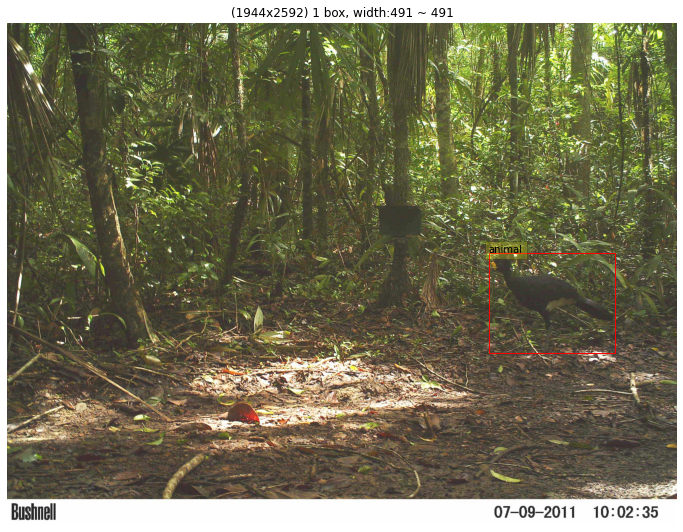

2 [1.]


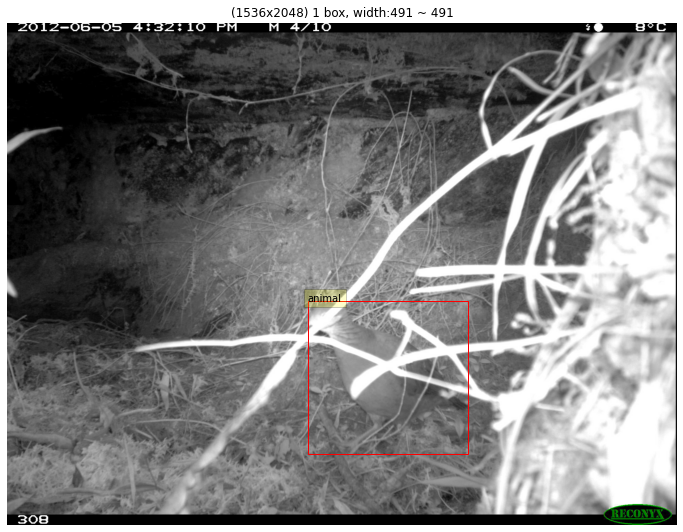

4 [1.]


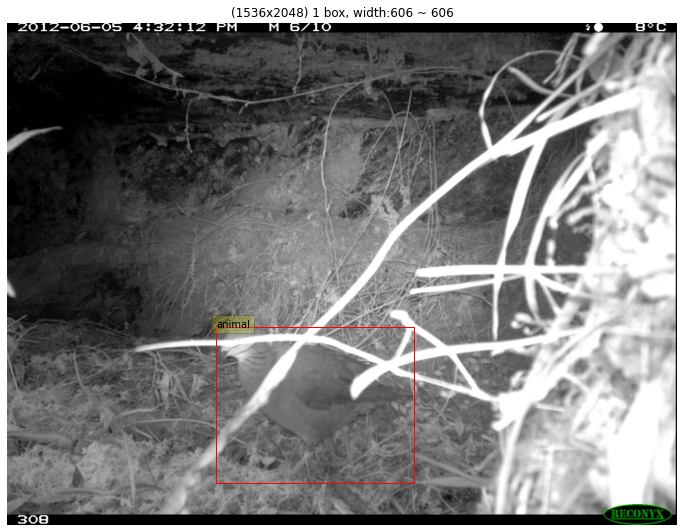

6 [1.]


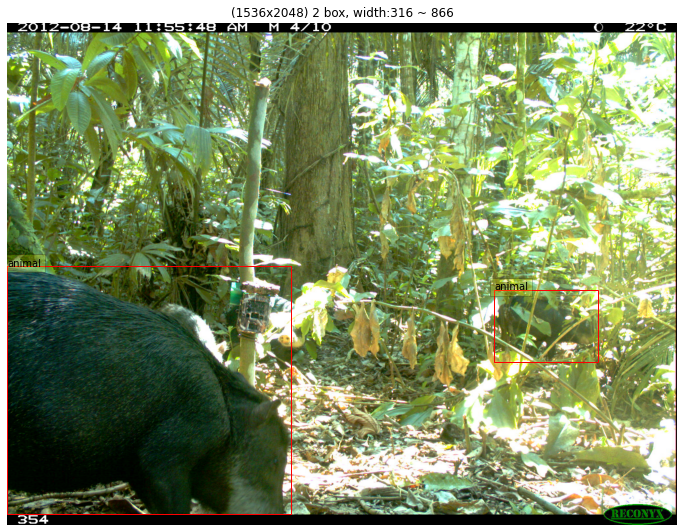

8 [1.]


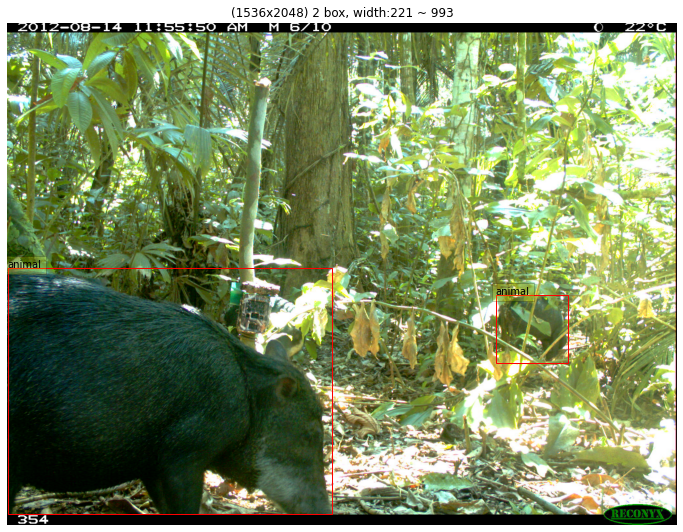

10 [1.]


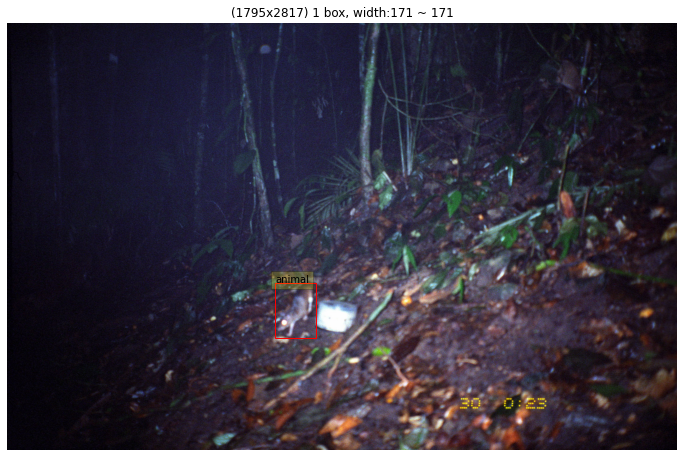

12 [1.]


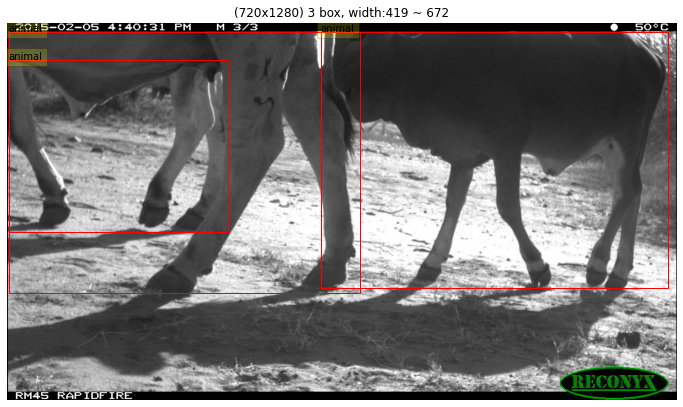

14 [1.]


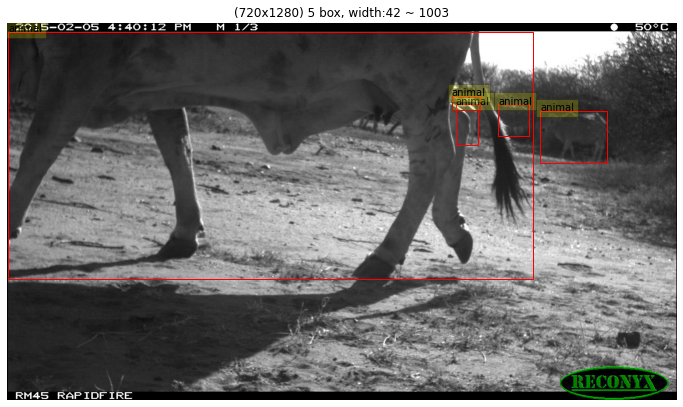

16 [1.]


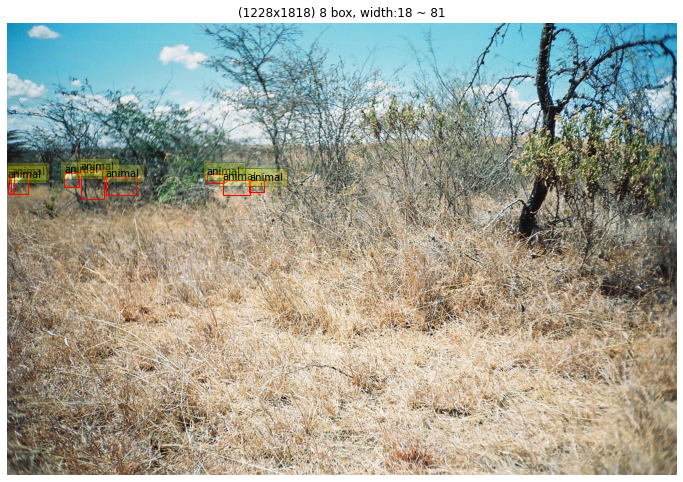

18 [1.]


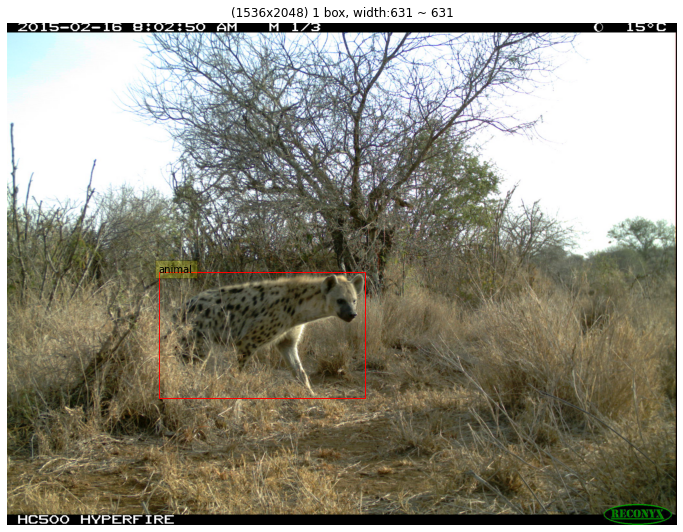

20 [1.]


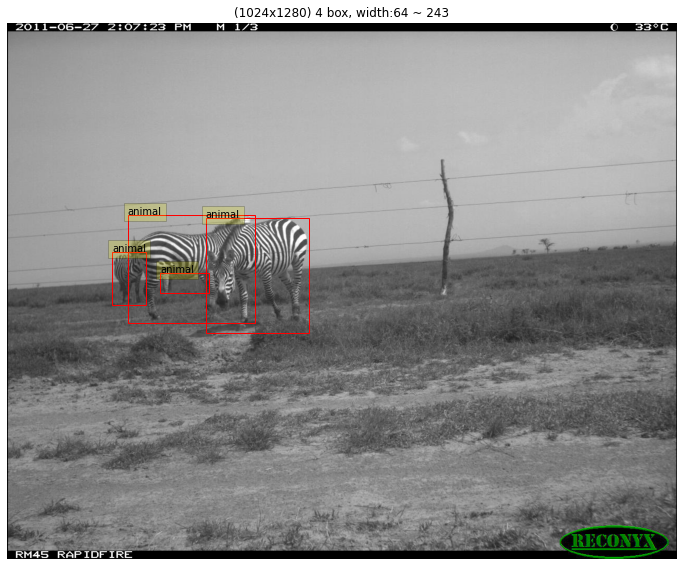

22 [1.]


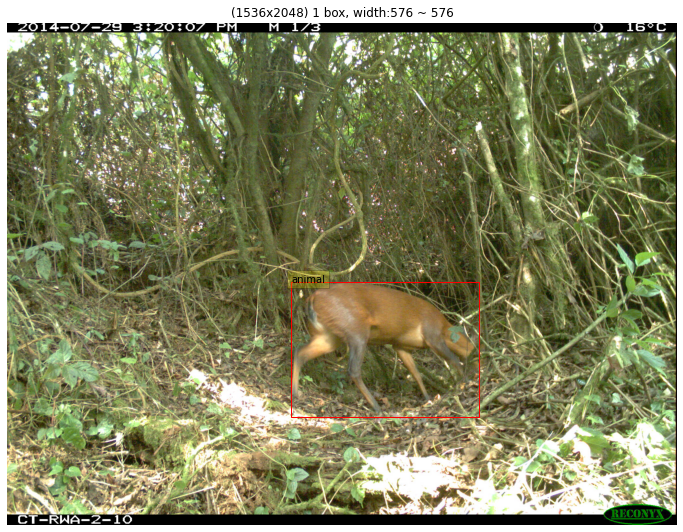

24 [1.]


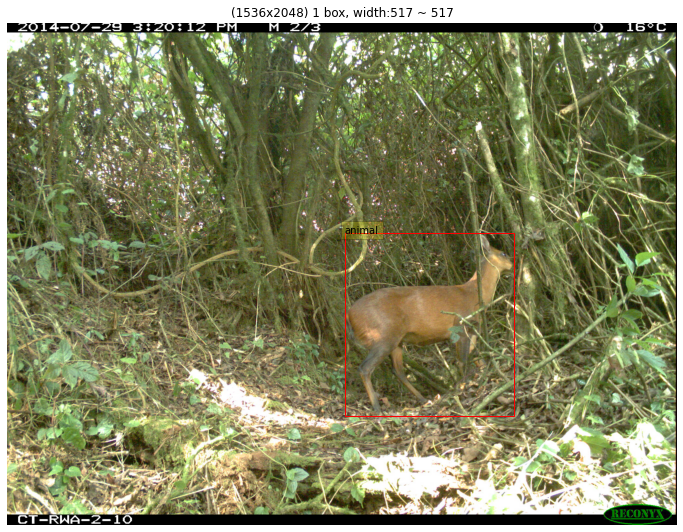

26 [1.]


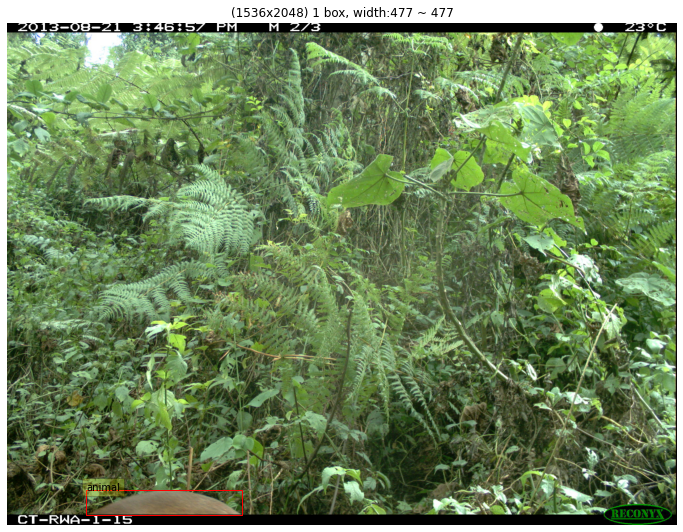

28 [1.]


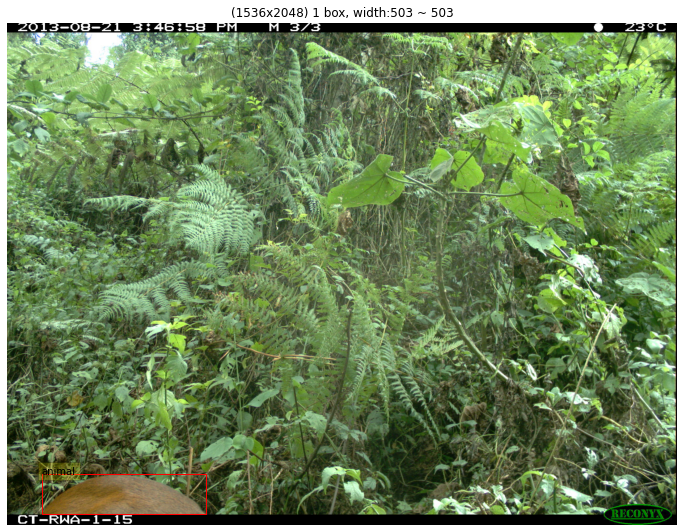

30 [1.]


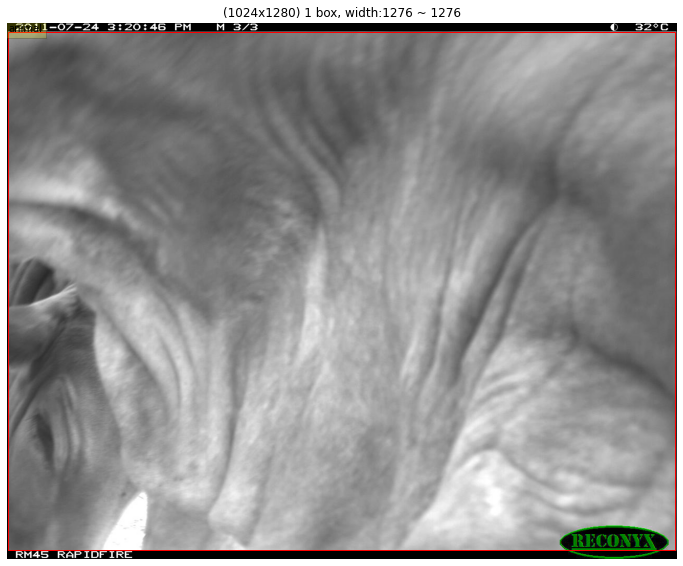

32 [3.]


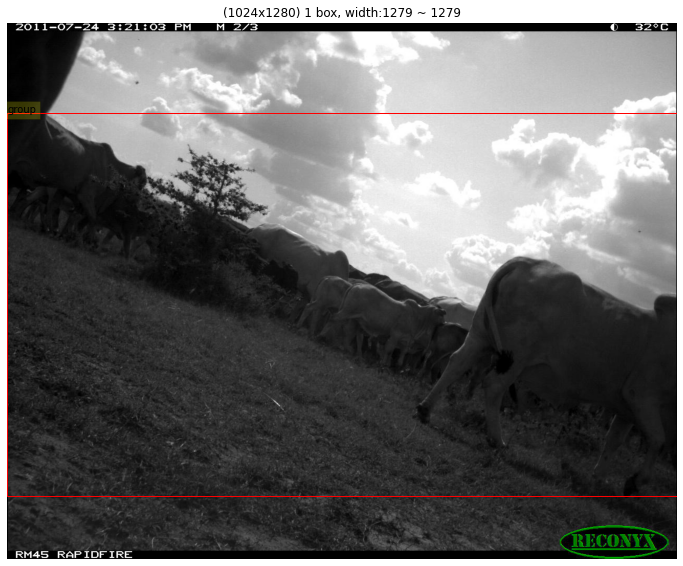

34 [1.]


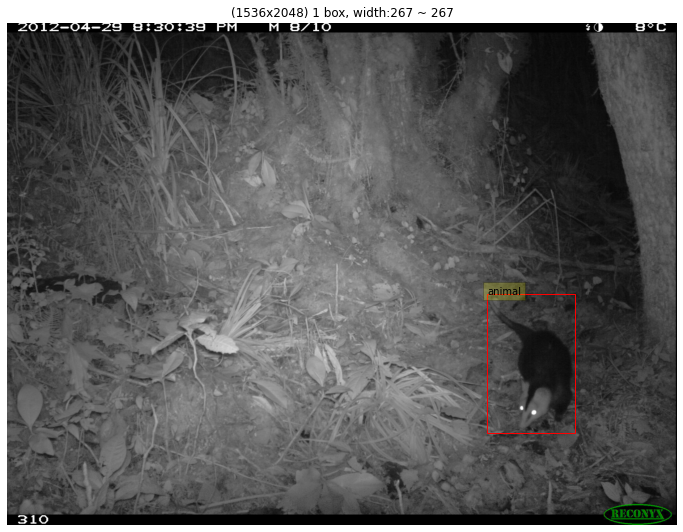

36 [1.]


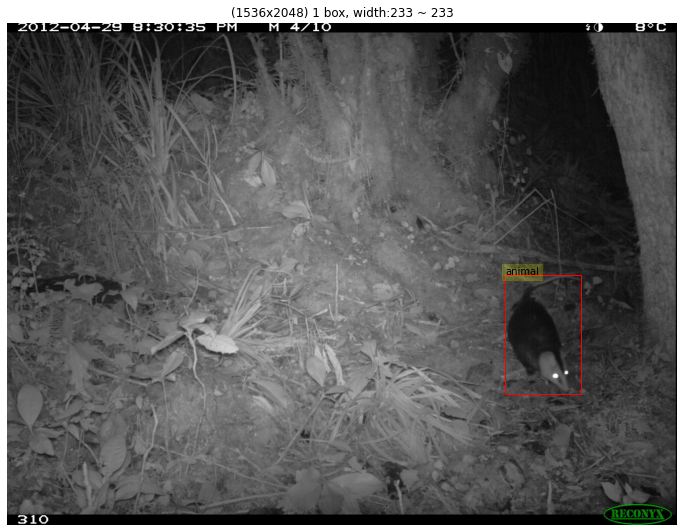

38 [1.]


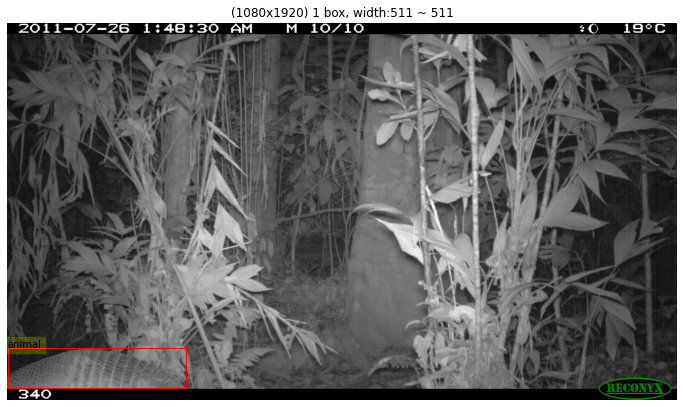

40 [1.]


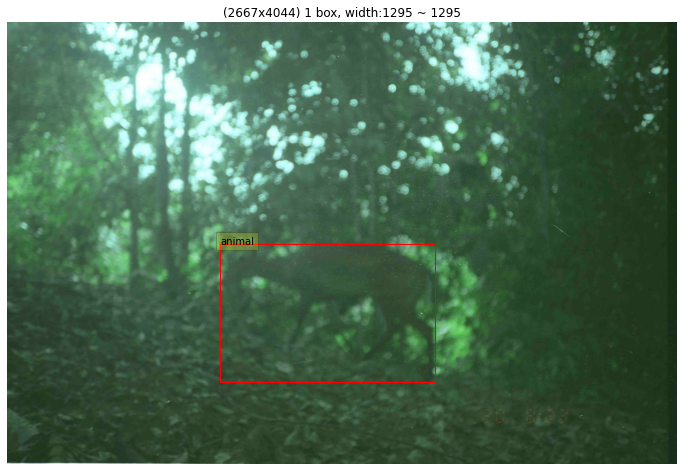

42 [1.]


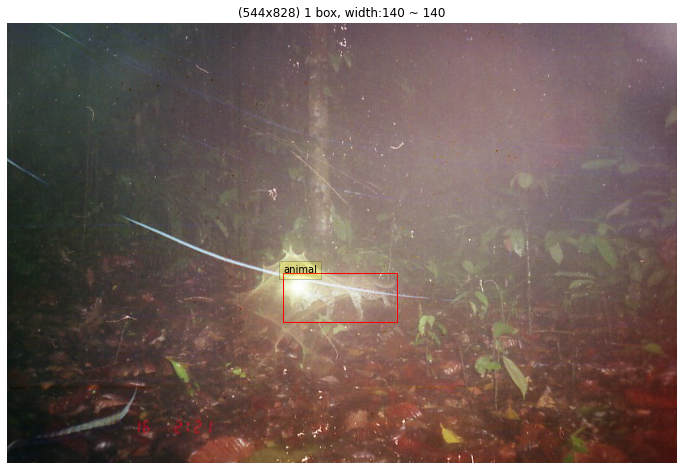

44 [1.]


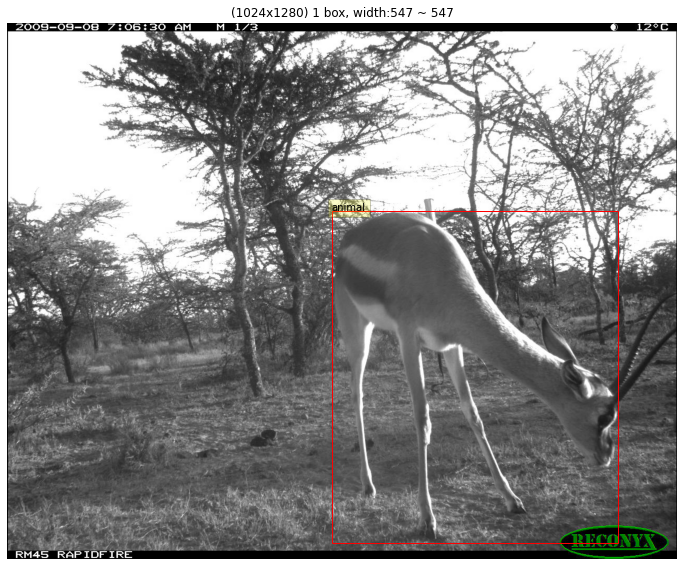

46 [1.]


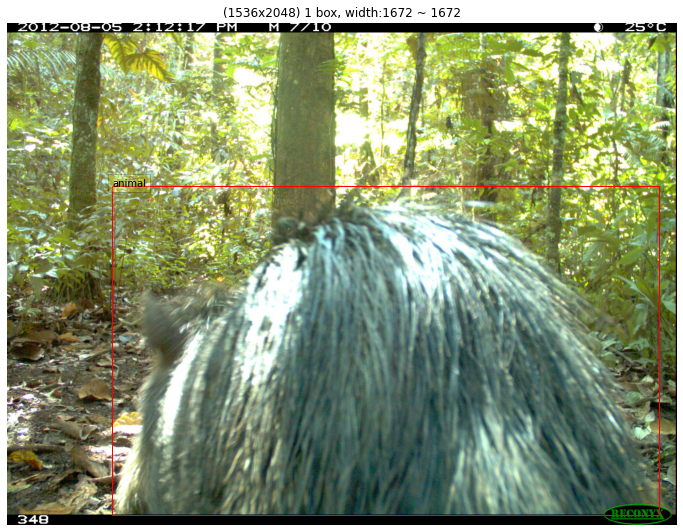

48 [1.]


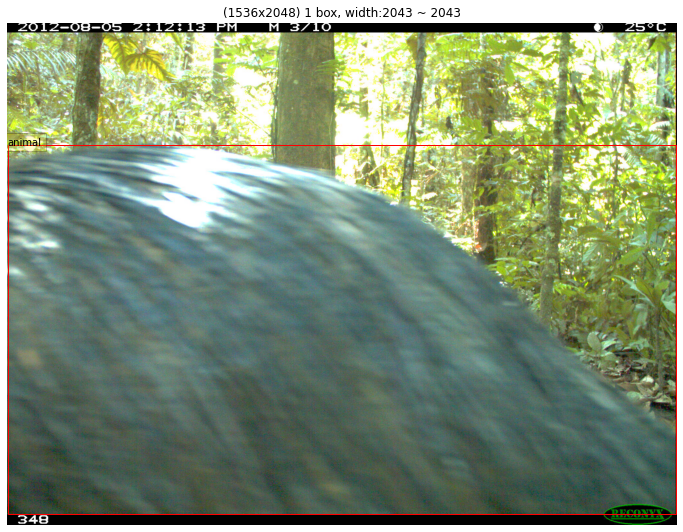

In [94]:
display_data(input_list, bbox_list, stride=2)